In [99]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import LinearRegression
import scipy
import ECoG
from sklearn.metrics import r2_score
import pywt

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import matplotlib

import pandas as pd
import time
import pickle

import torch as th
from tqdm import tqdm_notebook
from copy import deepcopy

import plotly.express as px

#### Load and preprocess data

In [2]:
x,y = ECoG.read_ECoG_from_csv("data/ECoG.csv","data/Motion.csv")

In [3]:
data = ECoG.ECoG(x,y,downsample = True)

#### Plots

In [4]:
fig_motion = px.scatter_3d(x=data.motion[:2000, 0], y=data.motion[:2000,1], z=data.motion[:2000,2], 
                    color = np.arange(2000))

In [5]:
fig_motion.show()

In [6]:
fig = px.line(x = np.arange(data.signal.shape[0]), y = data.signal[:, 2])

In [7]:
fig.show()

#### Local model

In [90]:
def my_poly(X, deg = 2):
    poly_features = np.ones(shape = (X.shape[0], 1))
    
    for i in range(deg+1):
        for j in range(deg+1):
            if i + j == 0: continue
            temp = X[:, 0] ** i * X[:, 1] ** j
            poly_features = np.hstack((poly_features, np.expand_dims(temp, axis = 1)))
            
    return poly_features

In [91]:
centers = np.array([[187,168],[190,126],[225,180],[229,141],[264,227],[264,193],[266,152],[282,215],[303,236],
              [303,198],[306,155],[325,221],[325,178],[323,136],[343,246],[349,205],[347,162],[340,120],[365,230],
            [365,185],[362,143],[386,212],[385,164],[380,122],[400,233],[405,190],[405,147],[420,214],[424,165],[424,125],
              [455,165],[460,125]], dtype = 'float')

In [92]:
centers = (centers - centers.mean(axis = 0)) / centers.std(axis = 0)

In [93]:
res = my_poly(centers)

In [94]:
linear_model = LinearRegression(fit_intercept = False, n_jobs = -1)

In [95]:
new_weights = np.empty(shape = (0, 9))
for signal in tqdm_notebook(data.signal[:8000]):
    weights = linear_model.fit(res, signal).coef_
    new_weights = np.vstack([new_weights, weights])

#### Wavelet transformation

In [83]:
def scalo(self, window, freqs, start, end, step = 100,lib='pywt'): #window in sec,freqs in Hz, step in ms
        div = 1
        X = self.signal[start:end,:]
        if self.downsample:
            div = 10
            
        window_len = int(((window * 1000 // step) + 2) * step//div)
        scalo = np.empty((X.shape[0]-window_len,X.shape[1],freqs.shape[0],(window * 1000 // step) + 2))
        for i in range(X.shape[1]):
            for j in range(window_len,X.shape[0]):
                if lib == 'pywt':
                    #print(type(pywt.cwt(data = X[j-window_len:j,i],wavelet='morl',scales = freqs)[0]))
                    scalo[j-window_len,i,:,:] = pywt.cwt(data=X[j-window_len:j,i],
                                                       wavelet='morl', scales=freqs)[0][:,::step//div] **2
        return scalo, self.motion[start+window_len:end,:], self.time[start+window_len:end]

In [ ]:
freq = np.linspace(1,14.5,10)

In [36]:
def rolling_window(a, window_size):
    shape = (a.shape[0] - window_size + 1, window_size) + a.shape[1:]
    strides = (a.strides[0],) + a.strides
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

In [73]:
res1 = pywt.cwt(data=voda, wavelet='morl', scales=freq, axis=1)[0][:,0,:,:]

In [78]:
res2 = pywt.cwt(data.signal[0:12], scales=freq, wavelet='morl', axis = 0)[0]

In [42]:
res3 = pywt.cwt(data.signal[12:24, 4], scales=freq, wavelet='morl', axis = 0)[0]

In [25]:
data_lm = deepcopy(data)

In [26]:
data_lm.signal = new_weights

In [60]:
%%time
freq = np.linspace(1,14.5,10)
scalo_pw, motion_pw, time_pw = data.scalo(1, freq, start = 0, end = 3000) # preprocess first 3000(30 sec) objects of 

CPU times: user 1min 14s, sys: 95 ms, total: 1min 14s
Wall time: 1min 14s


In [61]:
voda_ = rolling_window(data.signal[:3000], 12)

In [62]:
%%time
res_ = pywt.cwt(data=voda_, wavelet='morl', scales=freq, axis=1)[0]

CPU times: user 10.4 s, sys: 741 ms, total: 11.2 s
Wall time: 9.22 s


In [66]:
res_.shape

(10, 2989, 12, 32)

In [65]:
scalo_pw.shape

(2880, 32, 10, 12)

In [63]:
X_tupa = scalo_pw.reshape((scalo_pw.shape[0],scalo_pw.shape[1]*scalo_pw.shape[2]*scalo_pw.shape[3])) # transform a tensor to a matrix

In [67]:
res_tupa = res_.reshape((res_.shape[1], -1))

In [71]:
res_tupa[0]

array([ 0.22026585,  0.7215945 , -0.48162104, ...,  4.64996659,
       -3.13900686, -1.35592661])

In [72]:
X_tupa[0]

array([4.85170449e-02, 2.91899010e-01, 1.18534267e+00, ...,
       5.82636131e+03, 8.26725850e+03, 3.92337802e+03])

#### 3D signal visualization

In [85]:
def my_poly_plot(X, Y, deg = 2):
    poly_features = np.ones(shape = (X.shape[0], X.shape[1], 1))
    
    for i in range(deg+1):
        for j in range(deg+1):
            if i + j == 0: continue
            temp = X ** i * Y ** j
            poly_features = np.concatenate((poly_features, np.expand_dims(temp, axis = 2)), axis = 2)
            
    return poly_features

In [86]:
# Make data.
x_plot = np.linspace(-3, 2, 100)
y_plot = np.linspace(-1.75, 1.75, 100)
X, Y = np.meshgrid(x_plot, y_plot)

In [87]:
test = my_poly_plot(X, Y)

In [88]:
for_plot = test.reshape(-1, 9)

In [96]:
ex = np.dot(for_plot, new_weights.T).reshape(100, 100, 8000)

In [97]:
Z = ex[:, :, 0]

<IPython.core.display.Javascript object>


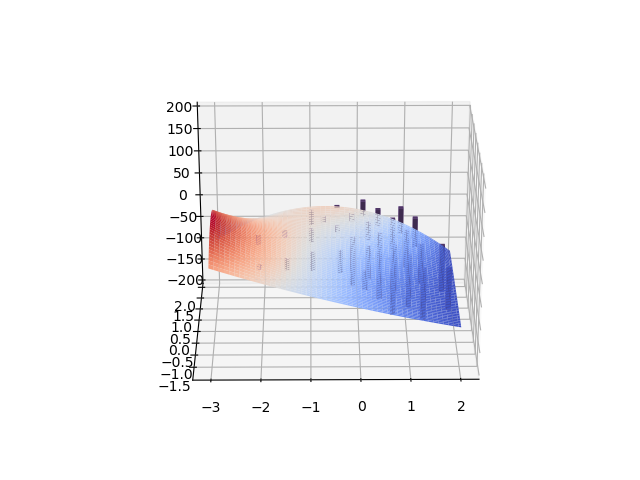

In [100]:
%matplotlib notebook
def update_plot(frame_number, ex, surf, signal):
    surf[0].remove()
    surf[0] = ax.plot_surface(X, Y, ex[:,:,frame_number], cmap=cm.coolwarm)
    surf[1].remove()
    surf[1] = ax.bar3d(centers[:,0], centers[:,1], np.zeros(32), dx = 0.1, dy = 0.1, dz = data.signal[frame_number])

fig = plt.figure()
ax = plt.axes(projection='3d')



# Plot the surface.
surf = [ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, color='0.75', rstride=1, cstride=1),
        ax.bar3d(centers[:,0], centers[:,1],  np.zeros(32), dx = 0.1, dy = 0.1, dz = data.signal[0])]

ax.set_zlim(-200,200)
ani = matplotlib.animation.FuncAnimation(fig, update_plot, 4000, fargs=(ex, surf, data.signal), interval=10)
plt.show()

<IPython.core.display.Javascript object>


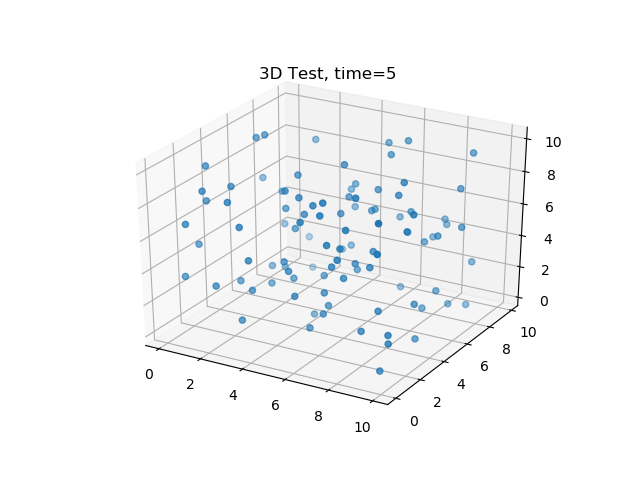

In [88]:
%matplotlib notebook
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation
import pandas as pd


a = np.random.rand(2000, 3)*10
t = np.array([np.ones(100)*i for i in range(20)]).flatten()
df = pd.DataFrame({"time": t ,"x" : a[:,0], "y" : a[:,1], "z" : a[:,2]})

def update_graph(num):
    data=df[df['time']==num]
    graph._offsets3d = (data.x, data.y, data.z)
    title.set_text('3D Test, time={}'.format(num))


fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
title = ax.set_title('3D Test')

data=df[df['time']==0]
graph = ax.scatter(data.x, data.y, data.z)

ani = matplotlib.animation.FuncAnimation(fig, update_graph, 19, 
                               interval=40, blit=False)

plt.show()

#### Fourie visualization

In [ ]:
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 36
plt.rcParams['axes.labelsize'] = 24

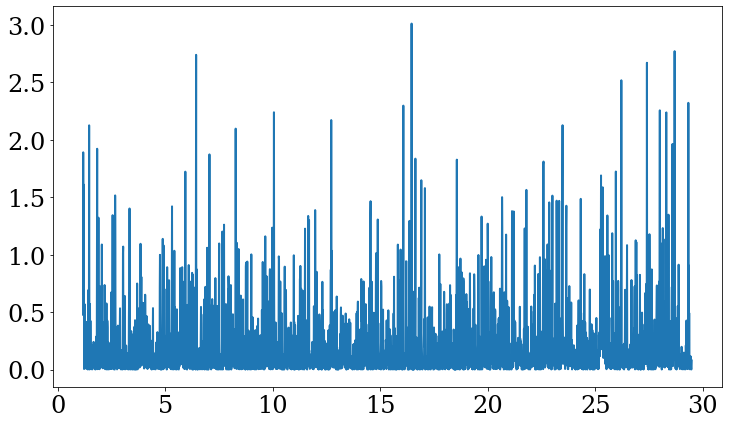

In [14]:
fig = plt.figure(figsize = (12, 7))
plt.plot(time_pw, scalo_pw[:, 0, 0, 0], )
plt.savefig('0freq.eps')

#### Model

In [30]:
X = scalo_pw.reshape((scalo_pw.shape[0],scalo_pw.shape[1]*scalo_pw.shape[2]*scalo_pw.shape[3])) # transform a tensor to a matrix

In [ ]:
X = (X - X.mean())/X.std()
motion_pw = (motion_pw - motion_pw.mean(axis = 0)) / motion_pw.std(axis = 0)

In [5]:
motion_pw = np.load('coord.npy')

In [6]:
X = np.load('zero_data.npy')

In [18]:
div = 10
window_len = int(((1 * 1000 // 100) + 2) * 100//div)

In [23]:
time_pw = data.time[0+window_len:100000]

In [8]:
X_train = X[:70000,:]
Y_train = motion_pw[:70000,:]
Y_test = motion_pw[70000:,:]
X_test = X[70000:,:]

In [24]:
def make_plots(model, X_train, Y_train, X_test, Y_test, dim = 0):
    Y_pred = model.predict(X_train)
    Y_pred_test = model.predict(X_test)
    
    plt.figure(figsize = (19,6))
    plt.plot(time_pw[:70000],Y_pred[:, dim],label = 'predicted')
    plt.plot(time_pw[:70000],Y_train[:, dim],label = 'true')
    plt.title("prediction of train data")
    plt.xlabel('t,sec')
    plt.ylabel('coord')
    plt.legend()
    plt.show()

    plt.figure(figsize = (15,6))
    plt.plot(time_pw[70000:],Y_pred_test[:, dim],label = 'predicted')
    plt.plot(time_pw[70000:],Y_test[:, dim],label = 'true')
    plt.xlabel('t,sec')
    plt.title("prediction of test data")
    plt.ylabel('coord')
    plt.legend()
    plt.show()

    print("Test score = ",[scipy.stats.pearsonr(Y_test[:,i],Y_pred_test[:,i])[0] for i in range(3)])
    print("Train score = ", [scipy.stats.pearsonr(Y_train[:,i],Y_pred[:,i])[0]  for i in range(3)])

In [ ]:
model = PLSRegression(n_components = 40)
model.fit(X_train,Y_train)

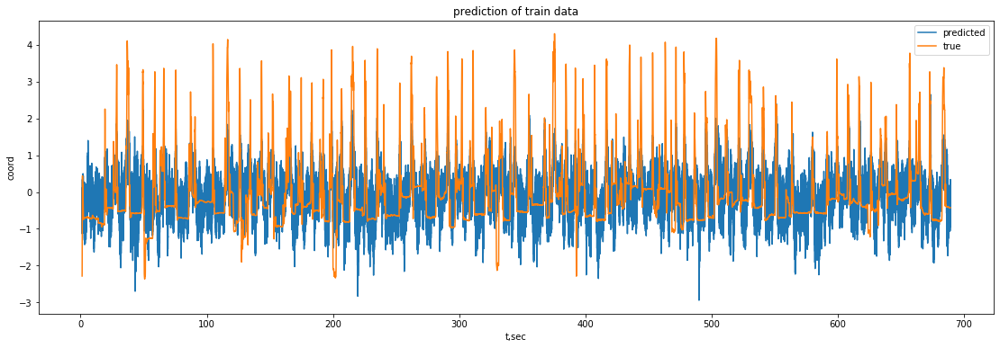

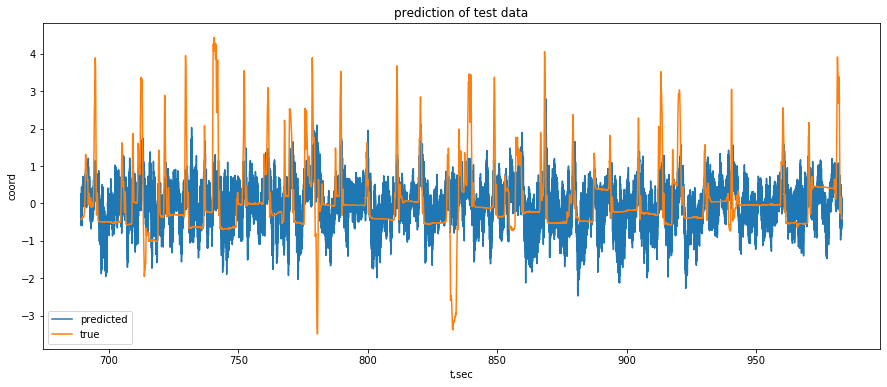

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [25]:
make_plots(model,X_train,Y_train,X_test,Y_test, 0)

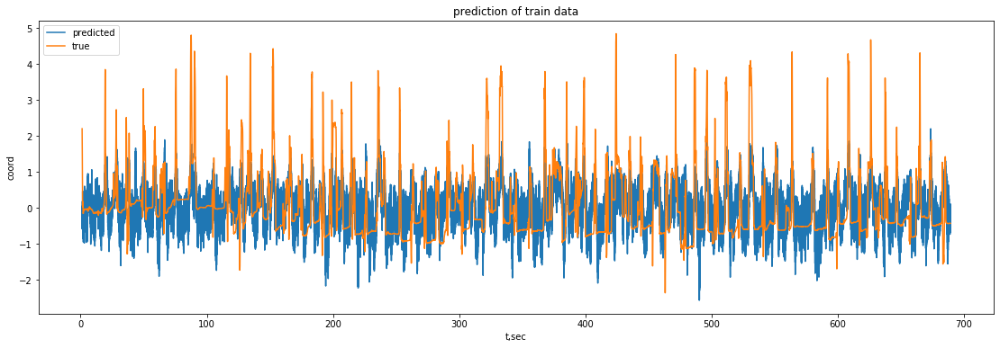

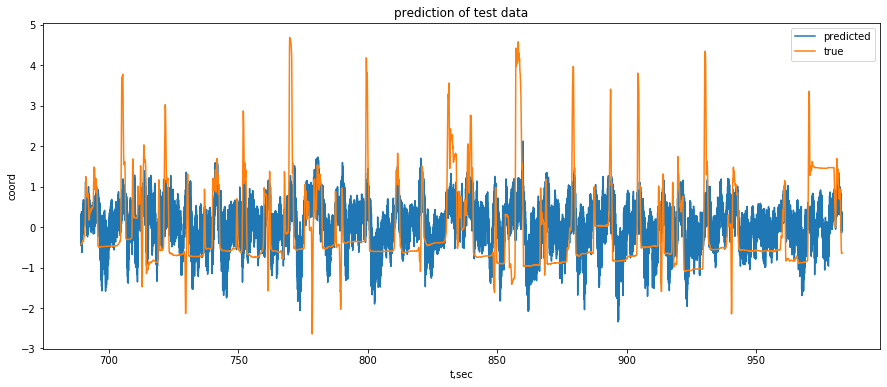

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [26]:
make_plots(model,X_train,Y_train,X_test,Y_test, 1)

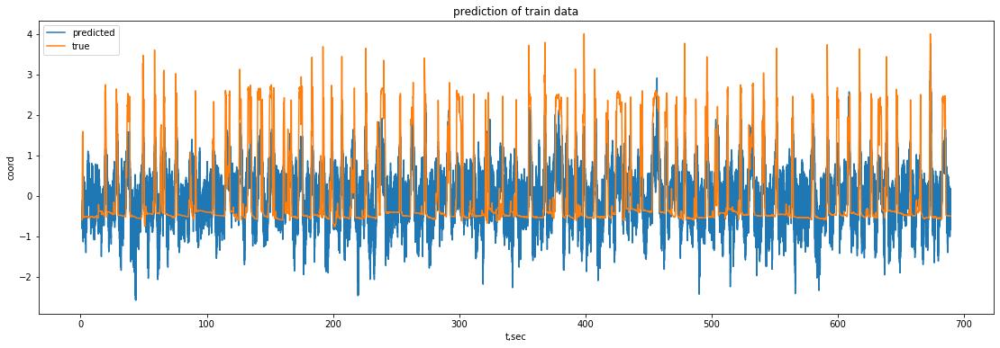

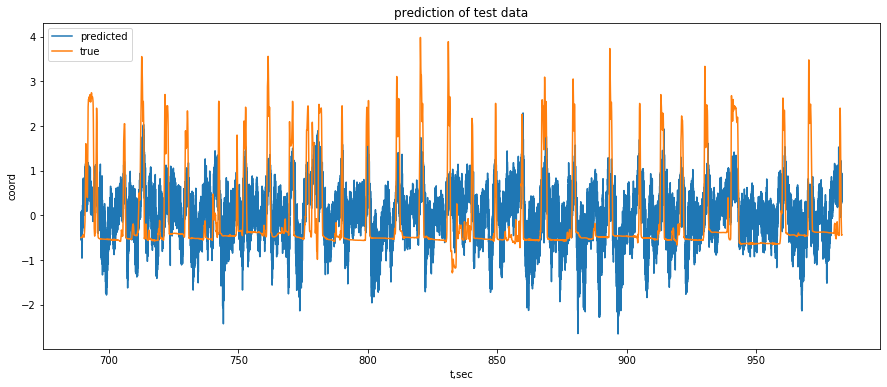

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]


In [27]:
make_plots(model,X_train,Y_train,X_test,Y_test, 2)

In [87]:
# My
Test score =  [0.3727009449197253, 0.4012925659384123, 0.44950956611378684]
Train score =  [0.4935692352994392, 0.5005954399269963, 0.5667159866409075]

SyntaxError: invalid syntax (<ipython-input-87-37878e7275bf>, line 2)

In [ ]:
# Classic

Test score =  [0.3289962270650608, 0.39028446011237033, 0.44508037871098577]
Train score =  [0.5888576467245724, 0.5678502356520467, 0.6344029229212296]

In [ ]:
Test score =  [0.22139768664110487, 0.21793364570665727, 0.3493731694004317]
Train score =  [0.35826540729628503, 0.3902240372620362, 0.4401628209653891]